In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import pycountry

from pandas import CategoricalDtype
from bs4 import BeautifulSoup
from datetime import date
from scipy import stats
from folium.plugins import HeatMap
import plotly.express as px

import sys
import os

Описание набора данных о землетрясениях (1990-2023 гг.)

Набор данных о землетрясениях представляет собой обширную коллекцию данных, содержащую информацию обо всех землетрясениях, зарегистрированных во всем мире с 1990 по 2023 год. Набор данных состоит примерно из трех миллионов строк, каждая из которых представляет конкретное землетрясение. Каждая запись в наборе данных содержит набор соответствующих атрибутов, связанных с землетрясением, таких как дата и время события, географическое положение (широта и долгота), магнитуда землетрясения, глубина эпицентра, тип землетрясения. величина, используемая для измерения, затронутый регион и другая соответствующая информация.

Описание датасета:
- time - время в милисекундах.
- place - географическое положение.
- status - представляет текущее состояние или условие события, которое может быть просмотрено или автоматически определено.
- tsunami (boolean value) - относится к серии больших океанских волн, обычно вызываемых подводными волнениями, часто связанными с землетрясениями.
- significance - обозначает важность или уровень воздействия события, которое можно использовать для оценки потенциальных последствий.
- data_type - указывает тип данных.
- magnitudo - относится к измерению размера или интенсивности землетрясения, обычно измеряемого по шкале Рихтера.
- state - представляет административную единицу или штат, где произошло событие.
- longitude - долгота.
- latitude - широта.
- depth - глубина землетрясения.
- date - дата и время землетрясения.

In [7]:
df = pd.read_csv('../data/Earthquakes-1990-2023.csv')

In [8]:
# берем сэмпл 120 000 строк
df = df[-200000:]

In [9]:
# просмотр датасета
df[:5]

,time,place,status,tsunami,significance,data_type,magnitude,state,longitude,latitude,depth,date
3245751,1646870404440,"8km NW of The Geysers, CA",reviewed,0,1,earthquake,0.23,California,-122.815500,38.829000,2.060000,2022-03-10 00:00:04.440000+00:00
3245752,1646870405230,"1 km WSW of Cowichan Bay, Canada",reviewed,0,16,explosion,1.02,Canada,-123.640333,48.730333,-0.310000,2022-03-10 00:00:05.230000+00:00
3245753,1646870718645,"13 km E of Fox, Alaska",reviewed,0,15,explosion,1.00,Alaska,-147.342700,64.968600,0.000000,2022-03-10 00:05:18.645000+00:00
3245754,1646870855790,"9 km SW of Port Angeles, Washington",reviewed,0,19,explosion,1.10,Washington,-123.518333,48.059500,-0.600000,2022-03-10 00:07:35.790000+00:00
3245755,1646870881600,"10 km E of P?hala, Hawaii",automatic,0,65,earthquake,2.06,Hawaii,-155.378006,19.219999,30.790001,2022-03-10 00:08:01.600000+00:00


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 3245751 to 3445750
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   time          200000 non-null  int64  
 1   place         200000 non-null  object 
 2   status        200000 non-null  object 
 3   tsunami       200000 non-null  int64  
 4   significance  200000 non-null  int64  
 5   data_type     200000 non-null  object 
 6   magnitude     200000 non-null  float64
 7   state         200000 non-null  object 
 8   longitude     200000 non-null  float64
 9   latitude      200000 non-null  float64
 10  depth         200000 non-null  float64
 11  date          200000 non-null  object 
dtypes: float64(4), int64(3), object(5)
memory usage: 18.3+ MB


In [11]:
# перенаименоване столбца time в корректное название milliseconds
df = df.rename(columns={'time': 'milliseconds'})

# перенаименоване столбца date в datetime
df = df.rename(columns={'date': 'datetime'})

# перенаименоване столбца state в country
df = df.rename(columns={'state': 'country'})

# отделение часового пояса из столбца datetime в новый столбец timezone
df['timezone'] = df['datetime'].str.extract(r'(\+\S+$)')

# удаление часового пояса из столбца date
df['datetime'] = df['datetime'].str.replace(r'\+\S+$', '', regex=True)

# удаление милисекунд в столбце datetime
df['datetime'] = df['datetime'].str.split('.').str[0]

# преобразуем столбец datetime в формат datetime64[ns]
df['datetime'] = pd.to_datetime(df['datetime'])

# Разделяем столбец 'datetime' на дату и время
#df[['date', 'time']] = df['datetime'].str.split(' ', expand=True)

## дропаем datetime после разделения на date и time
#df = df.drop('datetime', axis=1)

# преобразуем столбцы date и time в формат datetime64[ns]
#df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')
#df['time'] = pd.to_datetime(df['time'], format='%H:%M:%S')

In [12]:
"""Из-за присутствия в одном столбце нзвания штатов Америки и названия стран, необходимо поменять названия штатов на название страны USA"""
# удаляем лишние символы перед наименованием страны для будущей замены
df['country'] = df['country'].str.strip()

# лист с названиями штатов
us_states = ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 
             'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 
             'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 
             'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 
             'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 
             'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 
             'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming', 'south of Alaska']

# меняем названия штатов на USA
df['country'] = df['country'].apply(lambda country: 'USA' if any(state in country for state in us_states) else country)

In [13]:
# просматриваем что названия штатов поменялись на USA
df['country'].unique()

array(['USA', 'Canada', 'Puerto Rico', 'Svalbard and Jan Mayen', 'Tonga',
       'New Zealand', 'Iran', 'Solomon Islands', 'Banda Sea', 'Indonesia',
       'Russia', 'south of the Fiji Islands', 'West Chile Rise', 'Chile',
       'Japan', 'Aleutian Islands', 'B.C.', 'Vanuatu', 'Kuril Islands',
       'Fiji', 'Philippines', 'India', 'Mexico', 'Guatemala',
       'El Salvador', 'U.S. Virgin Islands',
       'south of the Kermadec Islands', 'east of the Kuril Islands',
       'Greece', 'Argentina', 'Dominican Republic region', 'Peru',
       'Tajikistan', 'Zambia', 'Fiji region', 'Timor Leste',
       'Puerto Rico region', 'South Sandwich Islands region',
       'Kermadec Islands region', 'Guam', 'Papua New Guinea', 'France',
       'Myanmar', 'Virgin Islands', 'Japan region', 'Iraq',
       'Wallis and Futuna', 'Greenland', 'Ecuador', 'Afghanistan',
       'Panama', 'Prince Edward Islands region',
       'Afghanistan-Tajikistan border region', 'north of Honduras', 'NV',
       'China', '

In [14]:
# просмотр количества стран
len(df['country'].unique())

383

In [15]:
# удаление слова "earthquake"
df['country'] = df['country'].str.replace('earthquake', '')

# удаление слова "Earthquake"
df['country'] = df['country'].str.replace('Earthquake', '')

# удаление слова "sequence"
df['country'] = df['country'].str.replace('sequence', '')

# удаление слова "Sequence"
df['country'] = df['country'].str.replace('Sequence', '')

# удаление слова "region"
df['country'] = df['country'].str.replace('region', '')

# удаление в столбце df['country'], лишних пробелов перед названием страны и после названия страны
df['country'] = df['country'].str.strip()

In [16]:
# получение списка стран
countries = [country.name for country in pycountry.countries]

# замена названий стран из списка countries
df['country'] = df['country'].map(lambda x: next((country for country in countries if country in x), x))
len(df['country'].unique())

272

In [17]:
# просматриваем после замены названий стран
df['country'].unique()

array(['USA', 'Canada', 'Puerto Rico', 'Svalbard and Jan Mayen', 'Tonga',
       'New Zealand', 'Iran', 'Solomon Islands', 'Banda Sea', 'Indonesia',
       'Russia', 'Fiji', 'Chile', 'Japan', 'Aleutian Islands', 'B.C.',
       'Vanuatu', 'Kuril Islands', 'Philippines', 'India', 'Mexico',
       'Guatemala', 'El Salvador', 'U.S. Virgin Islands',
       'south of the Kermadec Islands', 'east of the Kuril Islands',
       'Greece', 'Argentina', 'Dominica', 'Peru', 'Tajikistan', 'Zambia',
       'Timor Leste', 'South Sandwich Islands', 'Kermadec Islands',
       'Guam', 'Guinea', 'France', 'Myanmar', 'Virgin Islands', 'Iraq',
       'Wallis and Futuna', 'Greenland', 'Ecuador', 'Afghanistan',
       'Panama', 'Prince Edward Islands', 'Honduras', 'NV', 'China',
       'southern Mid-Atlantic Ridge', 'Pacific-Antarctic Ridge',
       'South Africa', 'Ñuñoa', 'Turkey', 'Portugal', 'Vietnam',
       'Romania', 'Grenada', 'Costa Rica', 'Macquarie Island', 'Bolivia',
       'Venezuela', 'Mozambiqu

In [18]:
# просмотр датасета
df[:5]

,milliseconds,place,status,tsunami,significance,data_type,magnitude,country,longitude,latitude,depth,datetime,timezone
3245751,1646870404440,"8km NW of The Geysers, CA",reviewed,0,1,earthquake,0.23,USA,-122.815500,38.829000,2.060000,2022-03-10 00:00:04,+00:00
3245752,1646870405230,"1 km WSW of Cowichan Bay, Canada",reviewed,0,16,explosion,1.02,Canada,-123.640333,48.730333,-0.310000,2022-03-10 00:00:05,+00:00
3245753,1646870718645,"13 km E of Fox, Alaska",reviewed,0,15,explosion,1.00,USA,-147.342700,64.968600,0.000000,2022-03-10 00:05:18,+00:00
3245754,1646870855790,"9 km SW of Port Angeles, Washington",reviewed,0,19,explosion,1.10,USA,-123.518333,48.059500,-0.600000,2022-03-10 00:07:35,+00:00
3245755,1646870881600,"10 km E of P?hala, Hawaii",automatic,0,65,earthquake,2.06,USA,-155.378006,19.219999,30.790001,2022-03-10 00:08:01,+00:00


In [19]:
# общая информация о датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 3245751 to 3445750
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   milliseconds  200000 non-null  int64         
 1   place         200000 non-null  object        
 2   status        200000 non-null  object        
 3   tsunami       200000 non-null  int64         
 4   significance  200000 non-null  int64         
 5   data_type     200000 non-null  object        
 6   magnitude     200000 non-null  float64       
 7   country       200000 non-null  object        
 8   longitude     200000 non-null  float64       
 9   latitude      200000 non-null  float64       
 10  depth         200000 non-null  float64       
 11  datetime      200000 non-null  datetime64[ns]
 12  timezone      200000 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(3), object(5)
memory usage: 19.8+ MB


In [20]:
# просмотр пропусков
df.isna().sum()

milliseconds    0
place           0
status          0
tsunami         0
significance    0
data_type       0
magnitude       0
country         0
longitude       0
latitude        0
depth           0
datetime        0
timezone        0
dtype: int64

In [21]:
# основные описательные статистики для числовых признаков
df.iloc[:, 1:].describe()

,tsunami,significance,magnitude,longitude,latitude,depth,datetime
count,200000.000000,200000.000000,200000.00000,200000.000000,200000.000000,200000.000000,200000
mean,0.000845,64.537300,1.62786,-115.437667,41.260037,26.224030,2022-11-17 18:14:30.933010176
min,0.000000,0.000000,-1.60000,-179.999700,-65.543900,-3.740000,2022-03-10 00:00:04
25%,0.000000,12.000000,0.87000,-153.141525,34.023833,3.570000,2022-07-14 15:51:41.249999872
50%,0.000000,30.000000,1.40000,-122.815170,38.926433,9.360000,2022-11-18 12:05:51.500000
75%,0.000000,66.000000,2.07000,-116.405500,58.240167,24.280000,2023-03-22 15:49:20.249999872
max,1.000000,2910.000000,7.80000,179.999400,86.647700,681.238000,2023-07-29 11:08:57
std,0.029057,94.958168,1.23405,71.867814,20.256346,55.484609,NaN


In [22]:
# основные описательные статистики для булевых и категориальных признаков
df.describe(include=["object", "bool"])

,place,status,data_type,country,timezone
count,200000,200000,200000,200000,200000
unique,59471,3,8,272,1
top,"8km NW of The Geysers, CA",reviewed,earthquake,USA,+00:00
freq,1767,180348,195110,169894,200000


In [23]:
# удаляем строки с отрицательными значениями магнитуды
df = df[df['magnitude'] >= 0]

# основные описательные статистики для числовых признаков после удаления отрицатльных значений магнитуды
df.iloc[:, 1:].describe()

,tsunami,significance,magnitude,longitude,latitude,depth,datetime
count,190422.000000,190422.000000,190422.000000,190422.000000,190422.000000,190422.000000,190422
mean,0.000888,67.783444,1.726356,-113.911449,40.690352,27.322849,2022-11-16 07:07:23.391031296
min,0.000000,0.000000,0.000000,-179.999700,-65.543900,-3.740000,2022-03-10 00:00:04
25%,0.000000,14.000000,0.940000,-152.637925,33.797333,3.960000,2022-07-13 23:08:54.750000128
50%,0.000000,30.000000,1.400000,-122.808166,38.836334,9.982000,2022-11-16 15:55:52.500000
75%,0.000000,68.000000,2.100000,-116.327825,58.211425,26.578500,2023-03-20 00:47:00.249999872
max,1.000000,2910.000000,7.800000,179.999400,86.647700,681.238000,2023-07-29 11:08:57
std,0.029778,96.179871,1.180583,73.131490,20.502281,56.629095,NaN


In [24]:
# создание карты с магнитудой
fig = px.scatter_geo(df, lat='latitude', lon='longitude',
                     color='magnitude', color_continuous_scale='reds',
                     hover_name='place', #size='magnitude',
                     title='Earthquakes Around the World')

fig.update_layout(
    geo=dict(
        landcolor='white',
        oceancolor='lightblue',
        showland=True,
        showocean=True,
    ),
    width=1200,  
    height=800,  
)

fig.show()

In [25]:
# # создание объекта карты
# mapObj = folium.Map([31.989210327459197, -44.07763413369443], zoom_start=3)

# # добавление тепловой карты на объект
# heatmap = folium.plugins.HeatMap(data=df[['latitude', 'longitude']].values.tolist(), radius=12)
# heatmap.add_to(mapObj)

# # отображение карты
# mapObj

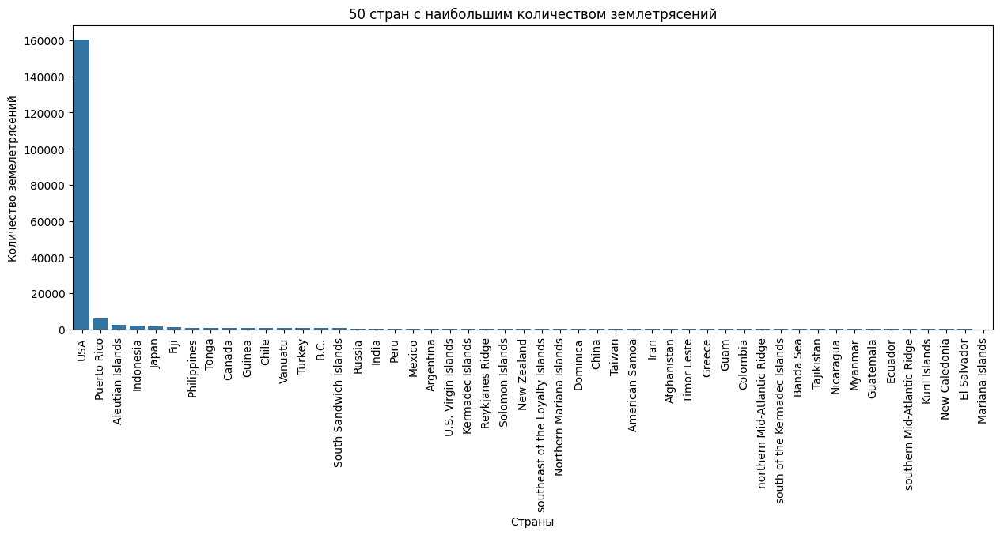

In [26]:
# подсчёт количества землетрясений в странах
counts = df['country'].value_counts()

# отображение первых 50 стран
plt.figure(figsize=(15, 5))
sns.barplot(x=counts.head(50).index, y=counts.head(50).values)
plt.xlabel('Страны')
plt.ylabel('Количество земелетрясений')
plt.title('50 стран с наибольшим количеством землетрясений')
plt.xticks(rotation=90)
plt.show()


Из-за большого количества земтретрясений в USA, для анализа посмотрим страны без USA.

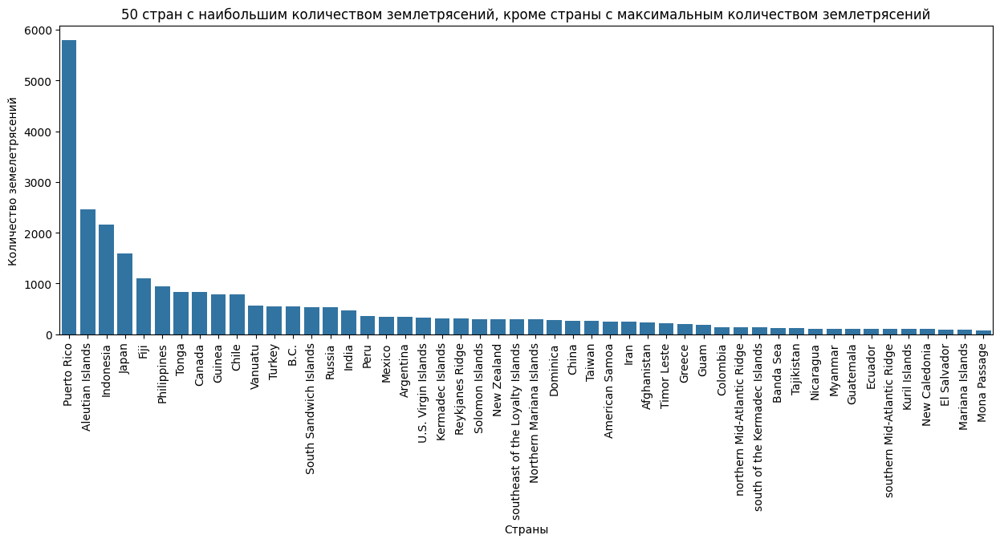

In [27]:
# отображение первых 50 стран, кроме USA
plt.figure(figsize=(15, 5))
sns.barplot(x=counts.iloc[1:51].index, y=counts.iloc[1:51].values)
plt.xlabel('Страны')
plt.ylabel('Количество земелетрясений')
plt.title('50 стран с наибольшим количеством землетрясений, кроме страны с максимальным количеством землетрясений')
plt.xticks(rotation=90)
plt.show()

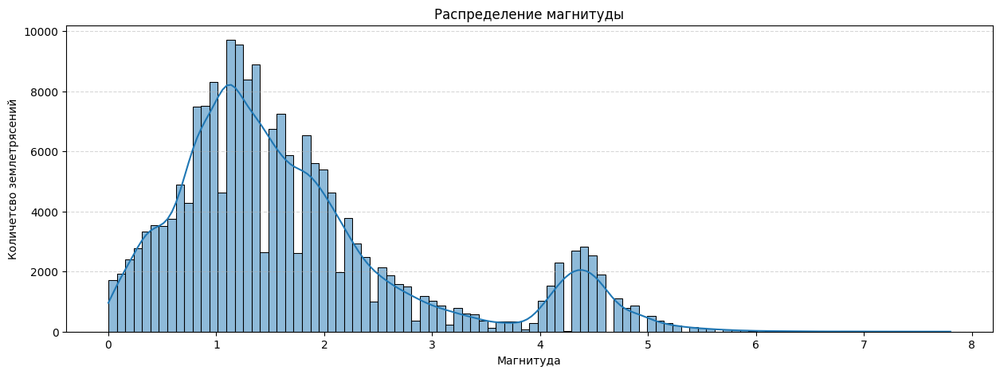

In [28]:
# просмотрим распределения магнитуды
plt.figure(figsize=(15, 5))
sns.histplot(data=df, x='magnitude', kde=True, bins=100, edgecolor='black')
plt.title('Распределение магнитуды')
plt.xlabel('Магнитуда')
plt.ylabel('Количетсво землетрясений')
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()


In [29]:
def get_bins_magnitude(data: int) -> str:
    """
    Генерация бинов для землетрясений"
    """
    if isinstance(data, (int, float)):
        if data <= 3:
            return 'green'
        elif 3 < data <= 5:
            return 'orange'
        elif data > 5:
            return 'red'

In [30]:
# генерация бинов, для будущей отрисовки прогноза на карте
df['magnitude_bins'] = df['magnitude'].apply(get_bins_magnitude)

In [31]:
# разделение datetime64[ns] по столбцам для будущего обучения моделей
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['day'] = df['datetime'].dt.day
df['hour'] = df['datetime'].dt.hour
df['minute'] = df['datetime'].dt.minute
df['second'] = df['datetime'].dt.second

In [32]:
# Сохранение DataFrame df в файл data/df.csv
df.to_csv('../data/df.csv', index=False)

In [33]:
df.shape

(190422, 20)